In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.25.2
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


¿Hay alguna comuna y/o región que no tenga un establecimientos de todos los tipos de complejidad y tipo de emergencia?

In [2]:
df_censo = pd.read_csv('../database/Cantidad-de-Personas-por-Sexo-y-Edad.csv', sep=";")
df_farmacias = pd.read_csv("../database/2.-Farmacias-Chile-07.2023.csv", sep=";", encoding="utf-8")
df_hospitales = pd.read_excel("../database/Establecimientos_ChileDEIS_MINSAL 03-11-2023.xlsx", sheet_name="Establecimientos Vigentes")

In [3]:
df_censo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7634 entries, 0 to 7633
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   ORDEN             7634 non-null   int64 
 1   NOMBRE REGIÓN     7634 non-null   object
 2   Código Región     7634 non-null   object
 3   NOMBRE PROVINCIA  7634 non-null   object
 4   Código Provincia  7634 non-null   object
 5   NOMBRE COMUNA     7634 non-null   object
 6   Código Comuna     7634 non-null   object
 7   Edad              7634 non-null   object
 8   Hombres           7634 non-null   object
 9   Mujeres           7634 non-null   object
 10  TOTAL             7634 non-null   object
dtypes: int64(1), object(10)
memory usage: 656.2+ KB


In [5]:
df_censo.columns

Index(['ORDEN', 'NOMBRE REGIÓN', 'Código Región', 'NOMBRE PROVINCIA',
       'Código Provincia', 'NOMBRE COMUNA', 'Código Comuna', 'Edad', 'Hombres',
       'Mujeres', 'TOTAL'],
      dtype='object')

In [6]:
df_farmacias.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5293 entries, 0 to 5292
Data columns (total 16 columns):
 #   Column                                           Non-Null Count  Dtype 
---  ------                                           --------------  ----- 
 0   Nombre Local                                     5293 non-null   object
 1   Empresa Farmacéutica                             5293 non-null   object
 2   Empresa RUT                                      5293 non-null   object
 3   Empresa Razón Social                             5293 non-null   object
 4   Número                                           5273 non-null   object
 5   Tipo                                             5293 non-null   object
 6   Dirección                                        5293 non-null   object
 7   Región                                           5293 non-null   object
 8   Comuna                                           5291 non-null   object
 9   Nro Resolución Apertura                  

In [7]:
df_hospitales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4527 entries, 0 to 4526
Data columns (total 32 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Versión 20231103  4489 non-null   object
 1   Unnamed: 1        4527 non-null   object
 2   Unnamed: 2        907 non-null    object
 3   Unnamed: 3        892 non-null    object
 4   Unnamed: 4        4527 non-null   object
 5   Unnamed: 5        4527 non-null   object
 6   Unnamed: 6        4484 non-null   object
 7   Unnamed: 7        4527 non-null   object
 8   Unnamed: 8        4527 non-null   object
 9   Unnamed: 9        4527 non-null   object
 10  Unnamed: 10       4527 non-null   object
 11  Unnamed: 11       4527 non-null   object
 12  Unnamed: 12       4527 non-null   object
 13  Unnamed: 13       4527 non-null   object
 14  Unnamed: 14       4527 non-null   object
 15  Unnamed: 15       4527 non-null   object
 16  Unnamed: 16       4527 non-null   object
 17  Unnamed: 17   

In [8]:
def modificar_nombre_columna(nombre: str):
    nombre = nombre.strip()  
    nombre = nombre.lower() 
    nombre = nombre.replace(" ", "_")
    nombre = nombre.replace("\xa0", "_")
    return nombre

nuevos_nombres = {columna: modificar_nombre_columna(columna) for columna in df_censo.columns}
df_censo.rename(columns=nuevos_nombres, inplace=True)
df_censo.columns

df_censo["código_región"] = pd.to_numeric(df_censo["código_región"], errors="coerce")
df_censo["código_provincia"] = pd.to_numeric(df_censo["código_provincia"], errors="coerce")
df_censo["código_comuna"] = pd.to_numeric(df_censo["código_comuna"], errors="coerce")
df_censo["edad"] = df_censo["edad"].astype("category")
df_censo["hombres"] = df_censo["hombres"].str.replace(".", "").astype("int")
df_censo["mujeres"] = df_censo["mujeres"].str.replace(".", "").astype("int")
df_censo["total"] = df_censo["total"].str.replace(".", "").astype("int")

In [9]:
df_hospitales.columns = df_hospitales.loc[0,:]

In [10]:
df_hospitales.drop(0, inplace=True)
df_hospitales.drop(columns=["Código Antiguo ", "Código  Madre Antiguo", "Código Madre Nuevo", "Código  Madre Antiguo", "Fecha de Incorporación a la base o cambios", "Teléfono", "Fecha Inicio Funcionamiento", "Vía", "Certificación ", "Número", "Dirección", "Clasificcion Tipo de SAPU", "Dependencia Administrativa"], inplace=True)

In [11]:
df_hospitales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4526 entries, 1 to 4526
Data columns (total 20 columns):
 #   Column                                                      Non-Null Count  Dtype 
---  ------                                                      --------------  ----- 
 0   Código Vigente                                              4526 non-null   object
 1   Código Región                                               4526 non-null   object
 2   Nombre Región                                               4526 non-null   object
 3   Código Dependencia Jerárquica (SEREMI / Servicio de Salud)  4483 non-null   object
 4   Nombre Dependencia Jerárquica (SEREMI / Servicio de Salud)  4526 non-null   object
 5   Pertenencia al SNSS                                         4526 non-null   object
 6   Tipo Establecimiento (Unidad)                               4526 non-null   object
 7   Ámbito de Funcionamiento                                    4526 non-null   object
 8   Nombre O

In [12]:
df_hospitales.columns

Index(['Código Vigente', 'Código Región', 'Nombre Región',
       'Código Dependencia Jerárquica (SEREMI / Servicio de Salud)',
       'Nombre Dependencia Jerárquica (SEREMI / Servicio de Salud)',
       'Pertenencia al SNSS', 'Tipo Establecimiento (Unidad)',
       'Ámbito de Funcionamiento', 'Nombre Oficial', 'Nivel de Atención',
       'Código Comuna', 'Nombre Comuna', 'Tiene Servicio de Urgencia',
       'Tipo de Urgencia ', 'LATITUD      [Grados decimales]',
       'LONGITUD [Grados decimales]', 'Tipo de Prestador Sistema de Salud',
       'Estado de Funcionamiento', 'Nivel de Complejidad',
       'Tipo de Atención '],
      dtype='object', name=0)

In [13]:
df_hospitales.replace(["No Aplica", "Pendiente", "Completar", "No Aplica", "Por confirmar", "no Aplica", "Pendiente", "no aplica", "No Aplica"], np.NaN, inplace=True)

df_hospitales["Código Vigente"] = df_hospitales["Código Vigente"].astype("int")

df_hospitales["Código Región"] = df_hospitales["Código Región"].astype("int")

df_hospitales["Código Dependencia Jerárquica (SEREMI / Servicio de Salud)"] = df_hospitales["Código Dependencia Jerárquica (SEREMI / Servicio de Salud)"].astype("float")

df_hospitales["Pertenencia al SNSS"] = df_hospitales["Pertenencia al SNSS"].map(lambda x: x == 'Perteneciente' or x == True)
df_hospitales["Pertenencia al SNSS"] = df_hospitales["Pertenencia al SNSS"].astype("bool")

df_hospitales["Nivel de Atención"] = df_hospitales["Nivel de Atención"].astype("category")

df_hospitales["Tiene Servicio de Urgencia"] = df_hospitales["Tiene Servicio de Urgencia"].map(lambda x: x == 'SI' or x == True)
df_hospitales["Tiene Servicio de Urgencia"] = df_hospitales["Tiene Servicio de Urgencia"].astype("bool")
df_hospitales["Tipo de Urgencia "] = df_hospitales["Tipo de Urgencia "].astype("category")
df_hospitales["Tipo de Prestador Sistema de Salud"] = df_hospitales["Tipo de Prestador Sistema de Salud"].astype("category")

df_hospitales["Nivel de Complejidad"] = df_hospitales["Nivel de Complejidad"].astype("category")
df_hospitales["Tipo de Atención "] = df_hospitales["Tipo de Atención "].astype("category")

In [14]:
df_hospitales = df_hospitales[df_hospitales['Estado de Funcionamiento'].str.contains("Vigente", case=False, na=False)]
df_hospitales.drop(columns="Estado de Funcionamiento", inplace=True)

In [15]:

nuevos_nombres = {columna: modificar_nombre_columna(columna) for columna in df_hospitales.columns}
df_hospitales.rename(columns=nuevos_nombres, inplace=True)
df_hospitales.rename(columns={"latitud______[grados_decimales]": "latitud", "longitud_[grados_decimales]":"longitud"}, inplace=True)
df_hospitales["código_región"] = df_hospitales["código_región"].astype("int")
df_hospitales["código_comuna"] = df_hospitales["código_comuna"].astype("int")
df_hospitales["nombre_comuna"] = df_hospitales["nombre_comuna"].str.upper()
df_hospitales["tipo_establecimiento_(unidad)"] = df_hospitales["tipo_establecimiento_(unidad)"].str.strip()
df_hospitales.info()


<class 'pandas.core.frame.DataFrame'>
Index: 4525 entries, 1 to 4526
Data columns (total 19 columns):
 #   Column                                                      Non-Null Count  Dtype   
---  ------                                                      --------------  -----   
 0   código_vigente                                              4525 non-null   int64   
 1   código_región                                               4525 non-null   int64   
 2   nombre_región                                               4525 non-null   object  
 3   código_dependencia_jerárquica_(seremi_/_servicio_de_salud)  4482 non-null   float64 
 4   nombre_dependencia_jerárquica_(seremi_/_servicio_de_salud)  4483 non-null   object  
 5   pertenencia_al_snss                                         4525 non-null   bool    
 6   tipo_establecimiento_(unidad)                               4523 non-null   object  
 7   ámbito_de_funcionamiento                                    4525 non-null   object 

In [16]:
df_hospitales.loc[df_hospitales["nombre_región"] == "Región De los Ríos", "nombre_región"] = "Región De Los Ríos"
df_hospitales.loc[df_hospitales["nombre_comuna"] == "CHILLÁN ", "nombre_comuna"] = "CHILLÁN"
df_hospitales.loc[df_hospitales["nombre_comuna"] == "LICANTEN", "nombre_comuna"] = "LICANTÉN"
df_hospitales.loc[df_hospitales["nombre_comuna"] == "VICHUQUEN", "nombre_comuna"] = "VICHUQUÉN"
df_hospitales.loc[df_hospitales["nombre_comuna"] == "CALERA","nombre_comuna"] = "LA CALERA"
df_hospitales.loc[df_hospitales["nombre_comuna"] == "LAS CONDES", "código_comuna"] = 13114
df_hospitales.loc[df_hospitales["nombre_comuna"] == "LA FLORIDA", "código_comuna"] = 13110


In [17]:
comunas_ñuble = {16109: 'YUNGAY',
 16105: 'PEMUCO',
 16104: 'EL CARMEN',
 16107: 'QUILLÓN',
 16108: 'SAN IGNACIO',
 16106: 'PINTO',
 16102: 'BULNES',
 16302: 'COIHUECO',
 16103: 'CHILLÁN VIEJO',
 16206: 'RÁNQUIL',
 16304: 'SAN FABIÁN',
 16101: 'CHILLÁN',
 16205: 'PORTEZUELO',
 16203: 'COELEMU',
 16305: 'SAN NICOLÁS',
 16301: 'SAN CARLOS',
 16207: 'TREGUACO',
 16204: 'NINHUE',
 16303: 'ÑIQUÉN',
 16201: 'QUIRIHUE',
 16202: 'COBQUECURA'}
comunas_ñuble = {v: k for k, v in comunas_ñuble.items()}


provincias_ñuble = {
    161: "DIGUILLÍN",
    162: "ITATA",
    163: "PUNILLA"
}


In [18]:
d = df_censo[df_censo["nombre_provincia"].str.contains("ÑUBLE")]
d["nombre_comuna"] = d["nombre_comuna"].str.replace(" *", "")
d
d["código_comuna"] = d["nombre_comuna"].map(comunas_ñuble).astype("string")
d["nombre_región"] = "ÑUBLE"
d["código_región"] = 16
d["código_provincia"] = d["código_comuna"].str.slice(0,3)
d["código_provincia"] = d["código_provincia"].astype("int")
d["nombre_provincia"] = d["código_provincia"].map(provincias_ñuble)





/tmp/ipykernel_611598/4203659101.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d["nombre_comuna"] = d["nombre_comuna"].str.replace(" *", "")
/tmp/ipykernel_611598/4203659101.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d["código_comuna"] = d["nombre_comuna"].map(comunas_ñuble).astype("string")
/tmp/ipykernel_611598/4203659101.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats 

In [19]:
df_censo.drop(df_censo[df_censo["nombre_provincia"].str.contains("ÑUBLE")].index, inplace=True)
df_censo = pd.concat([df_censo, d], ignore_index=True)
df_censo.sort_values(by="orden", inplace=True)
df_censo["código_comuna"] = df_censo["código_comuna"].astype("float")

In [20]:
codigo_comuna_a_provincia = dict(zip(df_censo['código_comuna'], df_censo['código_provincia']))
codigo_comuna_a_provincia = {int(comuna): int(provincia) for comuna, provincia in codigo_comuna_a_provincia.items() if not pd.isna(comuna)}
df_hospitales.loc[:, "código_provincia"] = df_hospitales["código_comuna"].map(codigo_comuna_a_provincia)
df_hospitales["código_provincia"] = df_hospitales["código_provincia"].astype("int")

In [21]:
codigo_comuna_a_region = dict(zip(df_censo['código_comuna'], df_censo['nombre_provincia']))
codigo_comuna_a_region = {int(comuna): str(provincia) for comuna, provincia in codigo_comuna_a_region.items() if not pd.isna(comuna)}
df_hospitales.loc[:, "nombre_provincia"] = df_hospitales["código_comuna"].map(codigo_comuna_a_region)
df_hospitales["código_provincia"] = df_hospitales["código_provincia"].astype("int")

In [22]:
nombre_comuna_a_codigo_comuna = {'ARICA': 15101, 'CAMARONES': 15102, 'PUTRE': 15201, 'GENERAL LAGOS': 15202, 'IQUIQUE': 1101, 'ALTO HOSPICIO': 1107, 'POZO ALMONTE': 1401, 'CAMIÑA': 1402, 'CAMINA': 1402, 'COLCHANE': 1403, 'HUARA': 1404, 'PICA': 1405, 'ANTOFAGASTA': 2101, 'MEJILLONES': 2102, 'SIERRA GORDA': 2103, 'TALTAL': 2104, 'CALAMA': 2201, 'OLLAGÜE': 2202, 'OLLAGUE': 2202, 'SAN PEDRO DE ATACAMA': 2203, 'TOCOPILLA': 2301, 'MARÍA ELENA': 2302, 'MARIA ELENA': 2302, 'COPIAPÓ': 3101, 'COPIAPO': 3101, 'CALDERA': 3102, 'TIERRA AMARILLA': 3103, 'CHAÑARAL': 3201, 'CHANARAL': 3201, 'DIEGO DE ALMAGRO': 3202, 'VALLENAR': 3301, 'ALTO DEL CARMEN': 3302, 'FREIRINA': 3303, 'HUASCO': 3304, 'LA SERENA': 4101, 'COQUIMBO': 4102, 'ANDACOLLO': 4103, 'LA HIGUERA': 4104, 'PAIGUANO': 4105, 'VICUÑA': 4106, 'VICUNA': 4106, 'ILLAPEL': 4201, 'CANELA': 4202, 'LOS VILOS': 4203, 'SALAMANCA': 4204, 'OVALLE': 4301, 'COMBARBALÁ': 4302, 'COMBARBALA': 4302, 'MONTE PATRIA': 4303, 'PUNITAQUI': 4304, 'RÍO HURTADO': 4305, 'RIO HURTADO': 4305, 'VALPARAÍSO': 5101, 'VALPARAISO': 5101, 'CASABLANCA': 5102, 'CONCÓN': 5103, 'CONCON': 5103, 'JUAN FERNÁNDEZ': 5104, 'JUAN FERNANDEZ': 5104, 'PUCHUNCAVÍ': 5105, 'PUCHUNCAVI': 5105, 'QUINTERO': 5107, 'VIÑA DEL MAR': 5109, 'VINA DEL MAR': 5109, 'ISLA DE PASCUA': 5201, 'LOS ANDES': 5301, 'CALLE LARGA': 5302, 'RINCONADA': 5303, 'SAN ESTEBAN': 5304, 'LA LIGUA': 5401, 'CABILDO': 5402, 'PAPUDO': 5403, 'PETORCA': 5404, 'ZAPALLAR': 5405, 'QUILLOTA': 5501, 'CALERA': 5502, 'LA CALERA': 5502, 'HIJUELAS': 5503, 'LA CRUZ': 5504, 'NOGALES': 5506, 'SAN ANTONIO': 5601, 'ALGARROBO': 5602, 'CARTAGENA': 5603, 'EL QUISCO': 5604, 'EL TABO': 5605, 'SANTO DOMINGO': 5606, 'SAN FELIPE': 5701, 'CATEMU': 5702, 'LLAILLAY': 5703, 'PANQUEHUE': 5704, 'PUTAENDO': 5705, 'SANTA MARÍA': 5706, 'SANTA MARIA': 5706, 'QUILPUÉ': 5801, 'QUILPUE': 5801, 'LIMACHE': 5802, 'OLMUÉ': 5803, 'OLMUE': 5803, 'VILLA ALEMANA': 5804, 'SANTIAGO': 13101, 'CERRILLOS': 13102, 'CERRO NAVIA': 13103, 'CONCHALÍ': 13104, 'CONCHALI': 13104, 'EL BOSQUE': 13105, 'ESTACIÓN CENTRAL': 13106, 'ESTACION CENTRAL': 13106, 'HUECHURABA': 13107, 'INDEPENDENCIA': 13108, 'LA CISTERNA': 13109, 'LA FLORIDA': 13110, 'LA GRANJA': 13111, 'LA PINTANA': 13112, 'LA REINA': 13113, 'LAS CONDES': 13114, 'LO BARNECHEA': 13115, 'LO ESPEJO': 13116, 'LO PRADO': 13117, 'MACUL': 13118, 'MAIPÚ': 13119, 'MAIPU': 13119, 'ÑUÑOA': 13120, 'NUNOA': 13120, 'PEDRO AGUIRRE CERDA': 13121, 'PEÑALOLÉN': 13122, 'PENALOLEN': 13122, 'PROVIDENCIA': 13123, 'PUDAHUEL': 13124, 'QUILICURA': 13125, 'QUINTA NORMAL': 13126, 'RECOLETA': 13127, 'RENCA': 13128, 'SAN JOAQUÍN': 13129, 'SAN JOAQUIN': 13129, 'SAN MIGUEL': 13130, 'SAN RAMÓN': 13131, 'SAN RAMON': 13131, 'VITACURA': 13132, 'PUENTE ALTO': 13201, 'PIRQUE': 13202, 'SAN JOSÉ DE MAIPO': 13203, 'SAN JOSE DE MAIPO': 13203, 'COLINA': 13301, 'LAMPA': 13302, 'TILTIL': 13303, 'TIL-TIL': 13303, 'SAN BERNARDO': 13401, 'BUIN': 13402, 'CALERA DE TANGO': 13403, 'PAINE': 13404, 'MELIPILLA': 13501, 'ALHUÉ': 13502, 'ALHUE': 13502, 'CURACAVÍ': 13503, 'CURACAVI': 13503, 'MARÍA PINTO': 13504, 'MARIA PINTO': 13504, 'SAN PEDRO': 13505, 'TALAGANTE': 13601, 'EL MONTE': 13602, 'ISLA DE MAIPO': 13603, 'PADRE HURTADO': 13604, 'PEÑAFLOR': 13605, 'PENAFLOR': 13605, 'RANCAGUA': 6101, 'CODEGUA': 6102, 'COINCO': 6103, 'COLTAUCO': 6104, 'DOÑIHUE': 6105, 'DONIHUE': 6105, 'GRANEROS': 6106, 'LAS CABRAS': 6107, 'MACHALÍ': 6108, 'MACHALI': 6108, 'MALLOA': 6109, 'MOSTAZAL': 6110, 'OLIVAR': 6111, 'PEUMO': 6112, 'PICHIDEGUA': 6113, 'QUINTA DE TILCOCO': 6114, 'RENGO': 6115, 'REQUÍNOA': 6116, 'REQUINOA': 6116, 'SAN VICENTE': 6117, 'PICHILEMU': 6201, 'LA ESTRELLA': 6202, 'LITUECHE': 6203, 'MARCHIHUE': 6204, 'NAVIDAD': 6205, 'PAREDONES': 6206, 'SAN FERNANDO': 6301, 'CHÉPICA': 6302, 'CHEPICA': 6302, 'CHIMBARONGO': 6303, 'LOLOL': 6304, 'NANCAGUA': 6305, 'PALMILLA': 6306, 'PERALILLO': 6307, 'PLACILLA': 6308, 'PUMANQUE': 6309, 'SANTA CRUZ': 6310, 'TALCA': 7101, 'CONSTITUCIÓN': 7102, 'CONSTITUCION': 7102, 'CUREPTO': 7103, 'EMPEDRADO': 7104, 'MAULE': 7105, 'PELARCO': 7106, 'PENCAHUE': 7107, 'RÍO CLARO': 7108, 'RIO CLARO': 7108, 'SAN CLEMENTE': 7109, 'SAN RAFAEL': 7110, 'CAUQUENES': 7201, 'CHANCO': 7202, 'PELLUHUE': 7203, 'CURICÓ': 7301, 'CURICO': 7301, 'HUALAÑÉ': 7302, 'HUALANE': 7302, 'LICANTÉN': 7303, 'LICANTEN': 7303, 'MOLINA': 7304, 'RAUCO': 7305, 'ROMERAL': 7306, 'SAGRADA FAMILIA': 7307, 'TENO': 7308, 'VICHUQUÉN': 7309, 'VICHUQUEN': 7309, 'LINARES': 7401, 'COLBÚN': 7402, 'COLBUN': 7402, 'LONGAVÍ': 7403, 'LONGAVI': 7403, 'PARRAL': 7404, 'RETIRO': 7405, 'SAN JAVIER': 7406, 'VILLA ALEGRE': 7407, 'YERBAS BUENAS': 7408, 'CONCEPCIÓN': 8101, 'CONCEPCION': 8101, 'CORONEL': 8102, 'CHIGUAYANTE': 8103, 'FLORIDA': 8104, 'HUALQUI': 8105, 'LOTA': 8106, 'PENCO': 8107, 'SAN PEDRO DE LA PAZ': 8108, 'SANTA JUANA': 8109, 'TALCAHUANO': 8110, 'TOMÉ': 8111, 'TOME': 8111, 'HUALPÉN': 8112, 'HUALPEN': 8112, 'LEBU': 8201, 'ARAUCO': 8202, 'CAÑETE': 8203, 'CANETE': 8203, 'CONTULMO': 8204, 'CURANILAHUE': 8205, 'LOS ÁLAMOS': 8206, 'LOS ALAMOS': 8206, 'TIRÚA': 8207, 'TIRUA': 8207, 'LOS ÁNGELES': 8301, 'LOS ANGELES': 8301, 'ANTUCO': 8302, 'CABRERO': 8303, 'LAJA': 8304, 'MULCHÉN': 8305, 'MULCHEN': 8305, 'NACIMIENTO': 8306, 'NEGRETE': 8307, 'QUILACO': 8308, 'QUILLECO': 8309, 'SAN ROSENDO': 8310, 'SANTA BÁRBARA': 8311, 'SANTA BARBARA': 8311, 'TUCAPEL': 8312, 'YUMBEL': 8313, 'ALTO BIOBÍO': 8314, 'ALTO BIOBIO': 8314, 'CHILLÁN': 16101, 'CHILLAN': 16101, 'BULNES': 16102, 'COBQUECURA': 16202, 'COELEMU': 16203, 'COIHUECO': 16302, 'CHILLÁN VIEJO': 16103, 'CHILLAN VIEJO': 16103, 'EL CARMEN': 16104, 'NINHUE': 16204, 'ÑIQUÉN': 16303, 'NIQUEN': 16303, 'PEMUCO': 16105, 'PINTO': 16106, 'PORTEZUELO': 16205, 'QUILLÓN': 16107, 'QUILLON': 16107, 'QUIRIHUE': 16201, 'RÁNQUIL': 16206, 'RANQUIL': 16206, 'SAN CARLOS': 16301, 'SAN FABIÁN': 16304, 'SAN FABIAN': 16304, 'SAN IGNACIO': 16108, 'SAN NICOLÁS': 16305, 'SAN NICOLAS': 16305, 'TREGUACO': 16207, 'YUNGAY': 16109, 'TEMUCO': 9101, 'CARAHUE': 9102, 'CUNCO': 9103, 'CURARREHUE': 9104, 'FREIRE': 9105, 'GALVARINO': 9106, 'GORBEA': 9107, 'LAUTARO': 9108, 'LONCOCHE': 9109, 'MELIPEUCO': 9110, 'NUEVA IMPERIAL': 9111, 'PADRE LAS CASAS': 9112, 'PERQUENCO': 9113, 'PITRUFQUÉN': 9114, 'PITRUFQUEN': 9114, 'PUCÓN': 9115, 'PUCON': 9115, 'SAAVEDRA': 9116, 'TEODORO SCHMIDT': 9117, 'TOLTÉN': 9118, 'TOLTEN': 9118, 'VILCÚN': 9119, 'VILCUN': 9119, 'VILLARRICA': 9120, 'CHOLCHOL': 9121, 'ANGOL': 9201, 'COLLIPULLI': 9202, 'CURACAUTÍN': 9203, 'CURACAUTIN': 9203, 'ERCILLA': 9204, 'LONQUIMAY': 9205, 'LOS SAUCES': 9206, 'LUMACO': 9207, 'PURÉN': 9208, 'PUREN': 9208, 'RENAICO': 9209, 'TRAIGUÉN': 9210, 'TRAIGUEN': 9210, 'VICTORIA': 9211, 'VALDIVIA': 14101, 'CORRAL': 14102, 'LANCO': 14103, 'LOS LAGOS': 14104, 'MÁFIL': 14105, 'MAFIL': 14105, 'MARIQUINA': 14106, 'PAILLACO': 14107, 'PANGUIPULLI': 14108, 'LA UNIÓN': 14201, 'LA UNION': 14201, 'FUTRONO': 14202, 'LAGO RANCO': 14203, 'RÍO BUENO': 14204, 'RIO BUENO': 14204, 'PUERTO MONTT': 10101, 'CALBUCO': 10102, 'COCHAMÓ': 10103, 'COCHAMO': 10103, 'FRESIA': 10104, 'FRUTILLAR': 10105, 'LOS MUERMOS': 10106, 'LLANQUIHUE': 10107, 'MAULLÍN': 10108, 'MAULLIN': 10108, 'PUERTO VARAS': 10109, 'CASTRO': 10201, 'ANCUD': 10202, 'CHONCHI': 10203, 'CURACO DE VÉLEZ': 10204, 'CURACO DE VELEZ': 10204, 'DALCAHUE': 10205, 'PUQUELDÓN': 10206, 'PUQUELDON': 10206, 'QUEILÉN': 10207, 'QUEILEN': 10207, 'QUELLÓN': 10208, 'QUELLON': 10208, 'QUEMCHI': 10209, 'QUINCHAO': 10210, 'OSORNO': 10301, 'PUERTO OCTAY': 10302, 'PURRANQUE': 10303, 'PUYEHUE': 10304, 'RÍO NEGRO': 10305, 'RIO NEGRO': 10305, 'SAN JUAN DE LA COSTA': 10306, 'SAN PABLO': 10307, 'CHAITÉN': 10401, 'CHAITEN': 10401, 'FUTALEUFÚ': 10402, 'FUTALEUFU': 10402, 'HUALAIHUÉ': 10403, 'HUALAIHUE': 10403, 'PALENA': 10404, 'COYHAIQUE': 11101, 'LAGO VERDE': 11102, 'AYSÉN': 11201, 'AYSEN': 11201, 'CISNES': 11202, 'GUAITECAS': 11203, 'COCHRANE': 11301, "O'HIGGINS": 11302, 'TORTEL': 11303, 'CHILE CHICO': 11401, 'RÍO IBÁÑEZ': 11402, 'RIO IBANEZ': 11402, 'PUNTA ARENAS': 12101, 'LAGUNA BLANCA': 12102, 'RÍO VERDE': 12103, 'RIO VERDE': 12103, 'SAN GREGORIO': 12104, 'CABO DE HORNOS': 12201, 'ANTÁRTICA': 12202, 'ANTARTICA': 12202, 'PORVENIR': 12301, 'PRIMAVERA': 12302, 'TIMAUKEL': 12303, 'NATALES': 12401, 'TORRES DEL PAINE': 12402, 'SAN FRANCISCO DE MOSTAZAL': 6110, 'ALTO BIO BIO': 8314, 'PUERTO NATALES': 12401, 'LLAY LLAY': 5703, 'MARCHIGUE': 6204, 'CHOL CHOL': 9121, 'PAIHUANO': 4105}

In [23]:
df_farmacias.loc[:,"código_comuna"] = df_farmacias.loc[:,"Comuna"].str.replace("Ñ", "N").map(nombre_comuna_a_codigo_comuna)
df_farmacias.loc[:,"código_provincia"] = df_farmacias.loc[:,"código_comuna"].map(codigo_comuna_a_provincia)
df_farmacias.loc[:,"código_región"] = df_farmacias.loc[:,"código_comuna"].map(codigo_comuna_a_region)

df_farmacias.dropna(subset="Comuna", inplace=True)
df_farmacias["código_comuna"] = df_farmacias["código_comuna"].astype("int")

In [24]:
nuevos_nombres = {columna: modificar_nombre_columna(columna) for columna in df_farmacias.columns}
df_farmacias.rename(columns=nuevos_nombres, inplace=True)

In [25]:
df_farmacias["latitud"] = pd.to_numeric(df_farmacias['latitud'], errors='coerce')
df_farmacias["longitud"] = pd.to_numeric(df_farmacias['longitud'], errors='coerce')

In [26]:
df_censo.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7634 entries, 0 to 7171
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   orden             7634 non-null   int64   
 1   nombre_región     7634 non-null   object  
 2   código_región     7612 non-null   float64 
 3   nombre_provincia  7634 non-null   object  
 4   código_provincia  7612 non-null   float64 
 5   nombre_comuna     7634 non-null   object  
 6   código_comuna     7612 non-null   float64 
 7   edad              7634 non-null   category
 8   hombres           7634 non-null   int64   
 9   mujeres           7634 non-null   int64   
 10  total             7634 non-null   int64   
dtypes: category(1), float64(3), int64(4), object(3)
memory usage: 664.2+ KB


In [29]:
poblacion_region = pd.DataFrame()

In [32]:
codigo_region = [ 1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]
nombre_region = ["Región De Tarapacá","Región De Antofagasta","Región De Atacama",
                 "Región De Coquimbo","Región De Valparaíso","Región Del Libertador Gral. B. O'Higgins",
                 "Región Del Maule","Región Del Bíobío","Región De La Araucanía","Región De Los Lagos",
                 "Región De Aysén del General Carlos Ibañez del Campo","Región De Magallanes y de la Antártica Chilena",
                 "Región Metropolitana de Santiago","Región De Los Ríos","Región De Arica Parinacota","Región De Ñuble"]
total_region = [330558,607534,286168,757586,1815902,914555,1044950,1556805,957224,828708,103158,166533,
                   7112808,384837,226068,480609]

                 

In [33]:
poblacion_region["codigo_región"] = codigo_region
poblacion_region["nombre_región"] = nombre_region
poblacion_region["Total"] = total_region

In [34]:
poblacion_region #dataframe con codigo por región y población total 2017

,codigo_región,nombre_región,Total
0,1,Región De Tarapacá,330558
1,2,Región De Antofagasta,607534
2,3,Región De Atacama,286168
3,4,Región De Coquimbo,757586
4,5,Región De Valparaíso,1815902
5,6,Región Del Libertador Gral. B. O'Higgins,914555
6,7,Región Del Maule,1044950
7,8,Región Del Bíobío,1556805
8,9,Región De La Araucanía,957224
9,10,Región De Los Lagos,828708


In [53]:
df2 =df2[["código_región","nombre_región"]] #para ver la correcta asociación de región y número

In [62]:
df2.value_counts() #suma de los valores por cada uno

código_región  nombre_región                                      
13             Región Metropolitana de Santiago                       975
8              Región Del Bíobío                                      423
10             Región De Los Lagos                                    419
7              Región Del Maule                                       410
5              Región De Valparaíso                                   403
9              Región De La Araucanía                                 401
6              Región Del Libertador Gral. B. O'Higgins               273
4              Región De Coquimbo                                     265
14             Región De Los Ríos                                     190
2              Región De Antofagasta                                  172
16             Región De Ñuble                                        155
3              Región De Atacama                                      141
1              Región De Tarapacá            

In [26]:
df_hospitales.columns

Index(['código_vigente', 'código_región', 'nombre_región',
       'código_dependencia_jerárquica_(seremi_/_servicio_de_salud)',
       'nombre_dependencia_jerárquica_(seremi_/_servicio_de_salud)',
       'pertenencia_al_snss', 'tipo_establecimiento_(unidad)',
       'ámbito_de_funcionamiento', 'nombre_oficial', 'nivel_de_atención',
       'código_comuna', 'nombre_comuna', 'tiene_servicio_de_urgencia',
       'tipo_de_urgencia', 'latitud', 'longitud',
       'tipo_de_prestador_sistema_de_salud', 'nivel_de_complejidad',
       'tipo_de_atención', 'código_provincia', 'nombre_provincia'],
      dtype='object', name=0)

Para saber la suma total de valores por categorías en cada columna, se realiza un value_counts() sobre las siguientes variables: nivel de complejidad, tiene servicio de urgencias y tipo de urgencias. 

In [27]:
df_hospitales["nivel_de_complejidad"].value_counts()

nivel_de_complejidad
Baja Complejidad       3174
Mediana Complejidad     595
Alta Complejidad        129
Name: count, dtype: int64

In [28]:
df_hospitales["tipo_de_urgencia"].value_counts()

tipo_de_urgencia
Urgencia Hospitalaria (UEH)     248
Urgencia Ambulatoria (SAPU)     234
Urgencia Ambulatoria (SUR)      156
Urgencia ambulatoria (SAR)       81
Urgencia Ambulatoria (SAR)        7
Ambulatoria CEAR                  4
Urgencia ambulatoria privada      4
Hospitalaria Especializada        3
Urgencia ambulatoria (SUR)        3
Ambulatoria Especializada         1
Urgencia ambulatoria              1
Name: count, dtype: int64

In [29]:
df_hospitales["tiene_servicio_de_urgencia"].value_counts()

tiene_servicio_de_urgencia
False    3784
True      741
Name: count, dtype: int64

Se necesita conocer por región aquellos tipos de urgencias existentes y realizar una sumatoria del total por cada una. Para recorrer los valores de esa columna se usa la función .unique() para no tener una duplicación de los valores en una misma región. Luego el for permite crear en cada iteración un dataframe que tenga solo la información de esa región en específico, siendo posible contabilizar el total específico con .value_counts() y hacer un print con el resumen.

Se realiza esta iteración con el mismo formato pero cambiando la columna que se recorre. Primeramente es por región, luego por provincia y finalmente por comuna. 

En este caso se recorren las variables que guardan las regiones/comunas/provincias con único código, ya que de esta forma hay una estandarización en los valores y no ocurren dificultades con las disitnitas fomras en que se escriben las localidades.

In [43]:
dt3 = df_hospitales[df_hospitales["nombre_provincia"] == "ISLA DE PASCUA"]
#ANTÁRTICA CHILENA            2
#ISLA DE PASCUA
dt3

,código_vigente,código_región,nombre_región,código_dependencia_jerárquica_(seremi_/_servicio_de_salud),nombre_dependencia_jerárquica_(seremi_/_servicio_de_salud),pertenencia_al_snss,tipo_establecimiento_(unidad),ámbito_de_funcionamiento,nombre_oficial,nivel_de_atención,...,nombre_comuna,tiene_servicio_de_urgencia,tipo_de_urgencia,latitud,longitud,tipo_de_prestador_sistema_de_salud,nivel_de_complejidad,tipo_de_atención,código_provincia,nombre_provincia
3856,112107,5,Región De Valparaíso,12.0,Servicio de Salud Metropolitano Oriente,True,Hospital,Establecimiento de Salud,Hospital Hanga Roa (Isla De Pascua),Primario,...,ISLA DE PASCUA,True,Urgencia Hospitalaria (UEH),-27.150245,-109.421012,Público,Baja Complejidad,Atención Cerrada-Hospitalaria,52,ISLA DE PASCUA


In [37]:
for region in df_hospitales["código_región"].unique(): #se itera en la columna "código_región"
    frame = df_hospitales[df_hospitales["código_región"] == region]  #dataframe creado por iteración según región en particular 
    print(f"Región: {region}")
    print(frame["tipo_de_urgencia"].value_counts()) #resumen que contabiliza los valores totales iguales por esa variable 
    print("\n")

#el código para el for fue consultado en chat gpt, se usa más de una vez esta misma estructura de código cmabiando los nombres y las variables necesitadas

Región: 12
tipo_de_urgencia
Urgencia Hospitalaria (UEH)     7
Urgencia Ambulatoria (SAPU)     4
Urgencia ambulatoria (SAR)      1
Ambulatoria CEAR                0
Ambulatoria Especializada       0
Hospitalaria Especializada      0
Urgencia Ambulatoria (SAR)      0
Urgencia Ambulatoria (SUR)      0
Urgencia ambulatoria            0
Urgencia ambulatoria (SUR)      0
Urgencia ambulatoria privada    0
Name: count, dtype: int64


Región: 8
tipo_de_urgencia
Urgencia Hospitalaria (UEH)     26
Urgencia Ambulatoria (SAPU)     23
Urgencia Ambulatoria (SUR)      16
Urgencia ambulatoria (SAR)      15
Urgencia Ambulatoria (SAR)       2
Ambulatoria CEAR                 0
Ambulatoria Especializada        0
Hospitalaria Especializada       0
Urgencia ambulatoria             0
Urgencia ambulatoria (SUR)       0
Urgencia ambulatoria privada     0
Name: count, dtype: int64


Región: 13
tipo_de_urgencia
Urgencia Ambulatoria (SAPU)     93
Urgencia Hospitalaria (UEH)     50
Urgencia ambulatoria (SAR)      

In [44]:
for provincia in df_hospitales["código_provincia"].unique(): # se itera en columna "codido_provincia"
    frame = df_hospitales[df_hospitales["código_provincia"] == provincia] #dataframe creado por iteración según provincia en particular 
    print(f"Provincia: {provincia}")
    print(frame["tipo_de_urgencia"].value_counts())
    print("\n")

Provincia: 122
tipo_de_urgencia
Urgencia Hospitalaria (UEH)     2
Ambulatoria CEAR                0
Ambulatoria Especializada       0
Hospitalaria Especializada      0
Urgencia Ambulatoria (SAPU)     0
Urgencia Ambulatoria (SAR)      0
Urgencia Ambulatoria (SUR)      0
Urgencia ambulatoria            0
Urgencia ambulatoria (SAR)      0
Urgencia ambulatoria (SUR)      0
Urgencia ambulatoria privada    0
Name: count, dtype: int64


Provincia: 123
tipo_de_urgencia
Urgencia Hospitalaria (UEH)     1
Ambulatoria CEAR                0
Ambulatoria Especializada       0
Hospitalaria Especializada      0
Urgencia Ambulatoria (SAPU)     0
Urgencia Ambulatoria (SAR)      0
Urgencia Ambulatoria (SUR)      0
Urgencia ambulatoria            0
Urgencia ambulatoria (SAR)      0
Urgencia ambulatoria (SUR)      0
Urgencia ambulatoria privada    0
Name: count, dtype: int64


Provincia: 121
tipo_de_urgencia
Urgencia Ambulatoria (SAPU)     3
Urgencia Hospitalaria (UEH)     3
Urgencia ambulatoria (SAR)      

In [41]:
for comuna in df_hospitales["código_comuna"].unique():
    frame = df_hospitales[df_hospitales["código_comuna"] == comuna]
    print(f"Comuna: {comuna}")
    print(frame["tipo_de_urgencia"].value_counts())
    print("\n")

Comuna: 12201
tipo_de_urgencia
Urgencia Hospitalaria (UEH)     2
Ambulatoria CEAR                0
Ambulatoria Especializada       0
Hospitalaria Especializada      0
Urgencia Ambulatoria (SAPU)     0
Urgencia Ambulatoria (SAR)      0
Urgencia Ambulatoria (SUR)      0
Urgencia ambulatoria            0
Urgencia ambulatoria (SAR)      0
Urgencia ambulatoria (SUR)      0
Urgencia ambulatoria privada    0
Name: count, dtype: int64


Comuna: 12303
tipo_de_urgencia
Ambulatoria CEAR                0
Ambulatoria Especializada       0
Hospitalaria Especializada      0
Urgencia Ambulatoria (SAPU)     0
Urgencia Ambulatoria (SAR)      0
Urgencia Ambulatoria (SUR)      0
Urgencia Hospitalaria (UEH)     0
Urgencia ambulatoria            0
Urgencia ambulatoria (SAR)      0
Urgencia ambulatoria (SUR)      0
Urgencia ambulatoria privada    0
Name: count, dtype: int64


Comuna: 12101
tipo_de_urgencia
Urgencia Ambulatoria (SAPU)     3
Urgencia Hospitalaria (UEH)     3
Urgencia ambulatoria (SAR)      1
A

In [30]:
for region in df_hospitales["código_región"].unique():
    frame = df_hospitales[df_hospitales["código_región"] == region]
    print(f"Región: {region}")
    print(frame["tiene_servicio_de_urgencia"].value_counts())
    print("\n")

Región: 12
tiene_servicio_de_urgencia
False    52
True     12
Name: count, dtype: int64


Región: 8
tiene_servicio_de_urgencia
False    341
True      82
Name: count, dtype: int64


Región: 13
tiene_servicio_de_urgencia
False    798
True     177
Name: count, dtype: int64


Región: 11
tiene_servicio_de_urgencia
False    55
True      6
Name: count, dtype: int64


Región: 10
tiene_servicio_de_urgencia
False    370
True      49
Name: count, dtype: int64


Región: 14
tiene_servicio_de_urgencia
False    162
True      28
Name: count, dtype: int64


Región: 15
tiene_servicio_de_urgencia
False    67
True      5
Name: count, dtype: int64


Región: 3
tiene_servicio_de_urgencia
False    124
True      17
Name: count, dtype: int64


Región: 5
tiene_servicio_de_urgencia
False    318
True      85
Name: count, dtype: int64


Región: 9
tiene_servicio_de_urgencia
False    342
True      59
Name: count, dtype: int64


Región: 16
tiene_servicio_de_urgencia
False    124
True      31
Name: count, dtype: int64


In [31]:
for comuna in df_hospitales['código_comuna'].unique(): # Se itera sobre la columna 
    frame = df_hospitales[df_hospitales['código_comuna'] == comuna] #dataframe creado por iteración según comuna en particular 
    print(f"Comuna: {comuna}")
    print(frame["tiene_servicio_de_urgencia"].value_counts())
    print("\n")

Comuna: 12201
tiene_servicio_de_urgencia
True    2
Name: count, dtype: int64


Comuna: 12303
tiene_servicio_de_urgencia
False    1
Name: count, dtype: int64


Comuna: 12101
tiene_servicio_de_urgencia
False    37
True      7
Name: count, dtype: int64


Comuna: 12301
tiene_servicio_de_urgencia
True     1
False    1
Name: count, dtype: int64


Comuna: 8301
tiene_servicio_de_urgencia
False    46
True      9
Name: count, dtype: int64


Comuna: 13201
tiene_servicio_de_urgencia
False    38
True      7
Name: count, dtype: int64


Comuna: 12103
tiene_servicio_de_urgencia
False    1
Name: count, dtype: int64


Comuna: 12102
tiene_servicio_de_urgencia
False    1
Name: count, dtype: int64


Comuna: 12104
tiene_servicio_de_urgencia
False    1
Name: count, dtype: int64


Comuna: 12401
tiene_servicio_de_urgencia
False    8
True     2
Name: count, dtype: int64


Comuna: 12402
tiene_servicio_de_urgencia
False    1
Name: count, dtype: int64


Comuna: 11302
tiene_servicio_de_urgencia
False    1
Name: cou

<Figure size 2100x600 with 0 Axes>

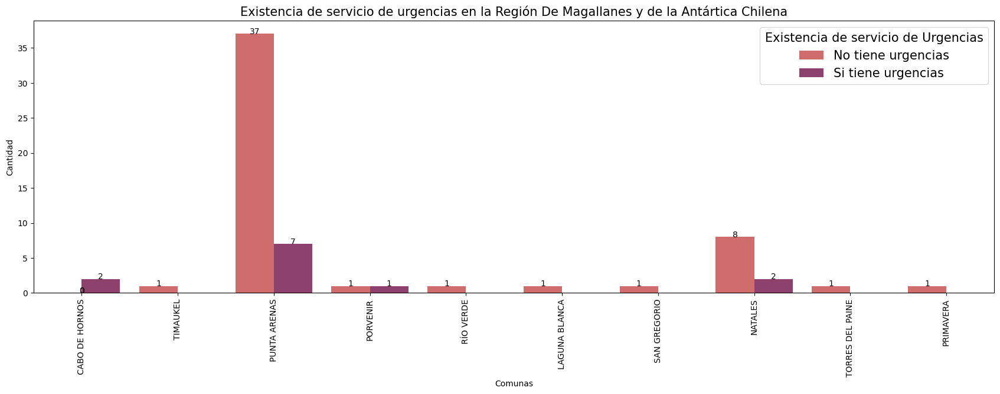

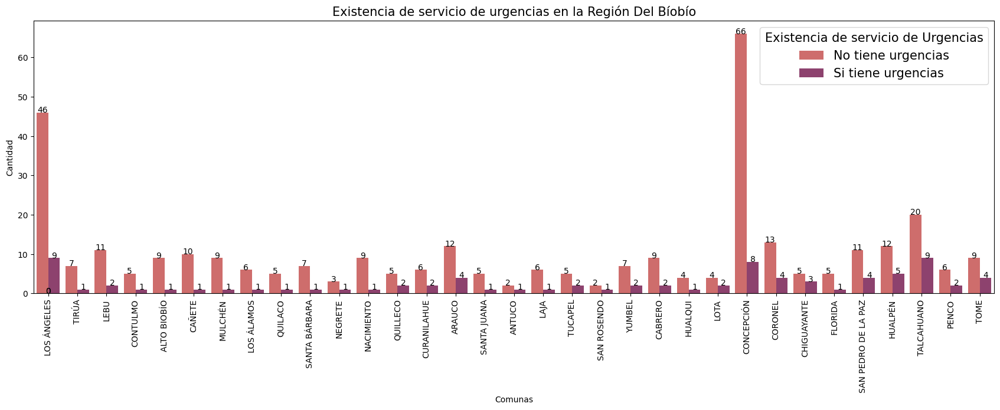

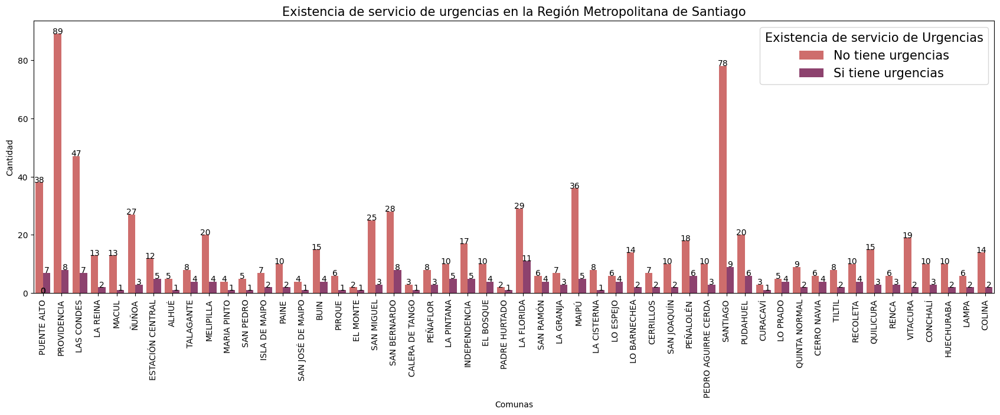

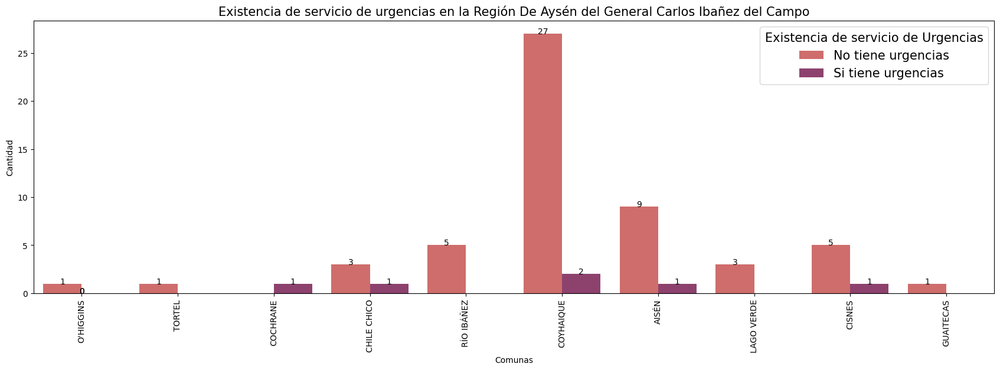

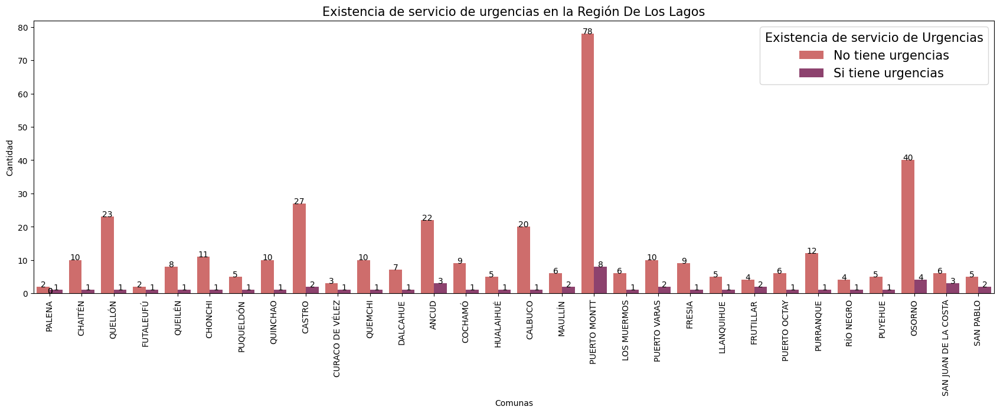

...

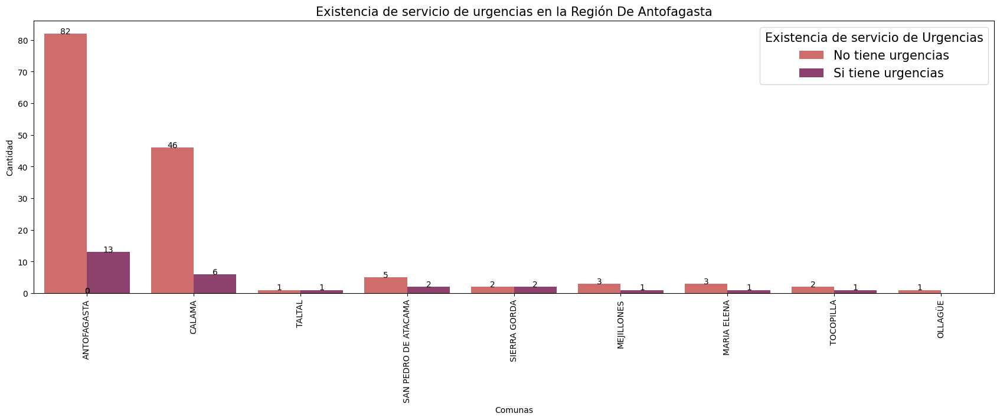

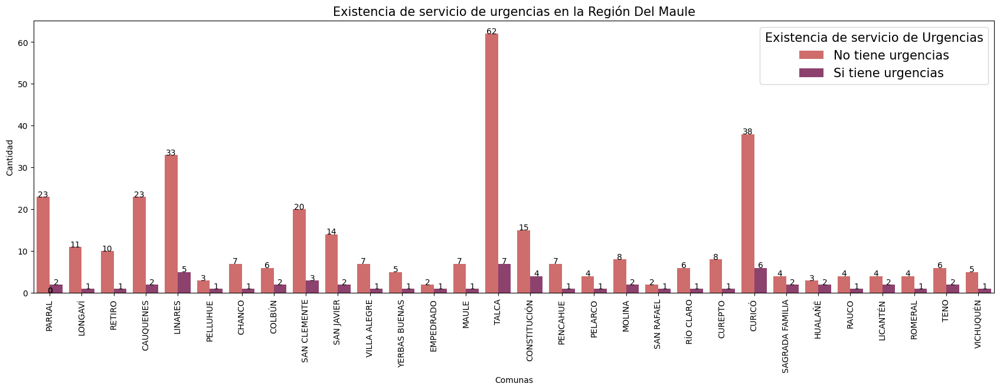

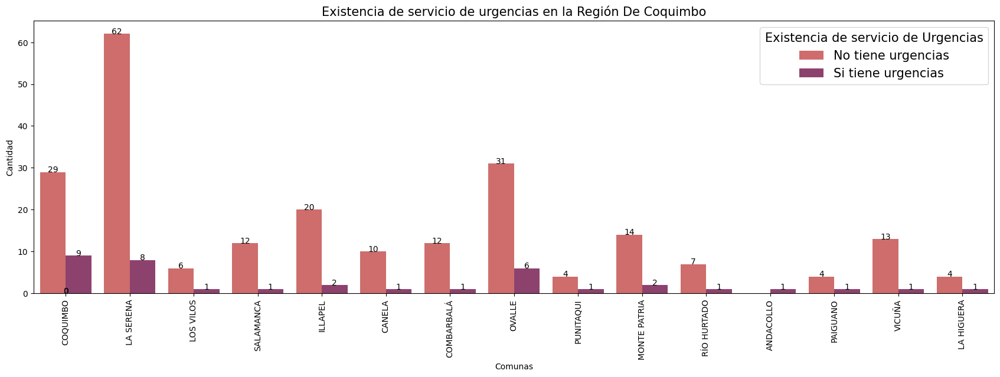

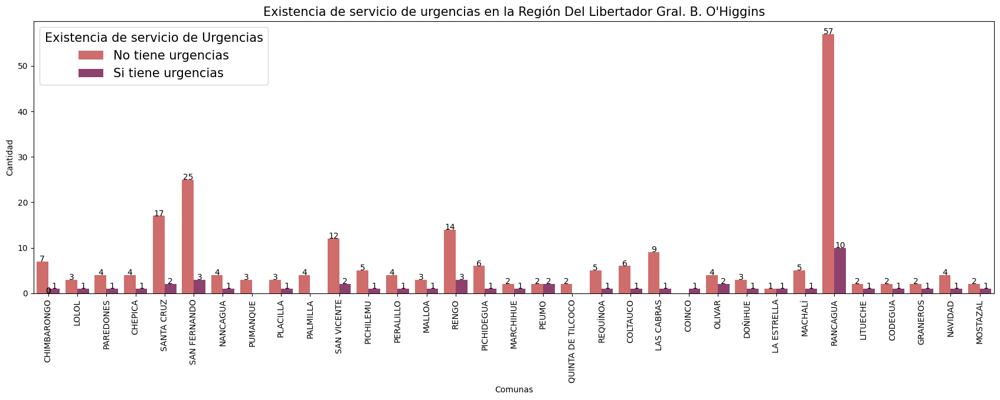

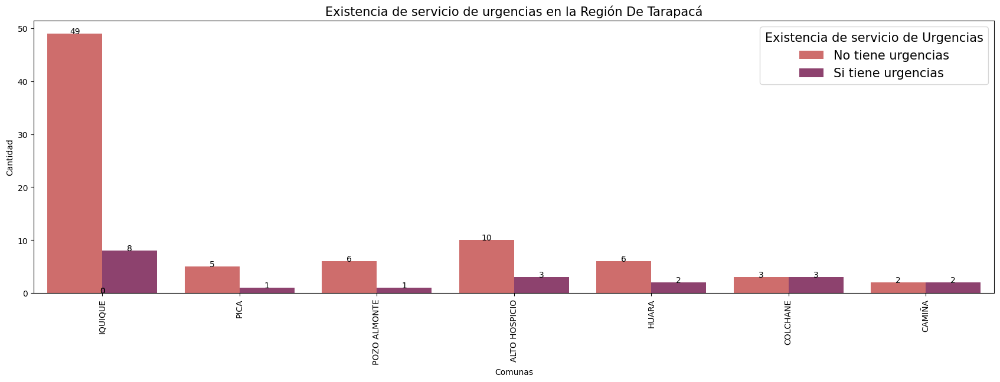

In [32]:
regiones_unicas = df_hospitales['nombre_región'].unique()  #Dataframe que permite tener la información por región sin repetición entre estas

# Establece el tamaño de la figura
plt.figure(figsize=(21, 6))

# Itera a través de las regiones y crea un gráfico para cada una
for region in regiones_unicas:
    plt.figure(figsize=(21, 6))
     #Se realiza un countplot por la existencia de categorías existencia de algún tipo de urgencia por región
    ax = sns.countplot(x="nombre_comuna", data=df_hospitales[df_hospitales['nombre_región'] == region], hue="tiene_servicio_de_urgencia", palette="flare")
    for p in ax.patches: # Iteración que permite hacer las anotaciones con los valores sobre cada barra
        ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline',fontsize = "10") 
    plt.title(f'Existencia de servicio de urgencias en la {region}',fontsize = "15") #Se escoge el título del gráfico
    plt.ylabel('Cantidad') #Se nombre el eje y
    plt.xlabel('Comunas') #Se nombra el eje x 
    legend = plt.legend(["No tiene urgencias", "Si tiene urgencias"], fontsize = "15") #Se configura el cuadro resumen de los valores 
    legend.set_title("Existencia de servicio de Urgencias", prop={"size": "15"})
    plt.xticks(rotation=90) #Se rotan la forma en que se presentan las barras del eje x 
    plt.show()
#chatgpt en annotate
#https://www.delftstack.com/es/howto/matplotlib/matplotlib-legend-title/

<Figure size 2100x600 with 0 Axes>

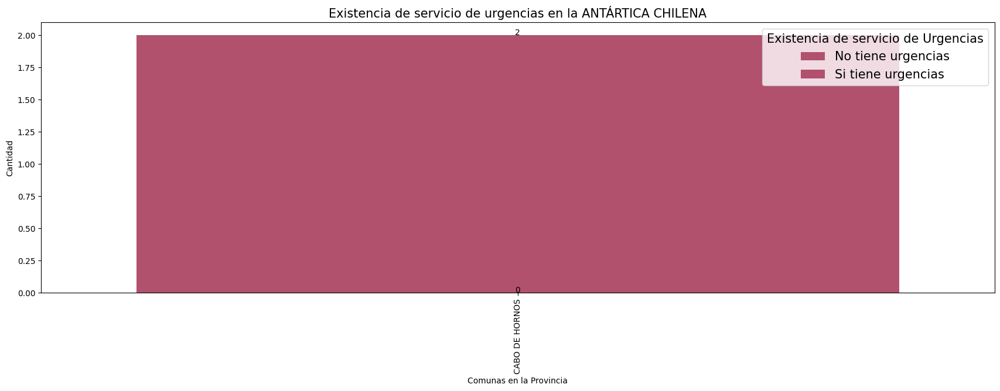

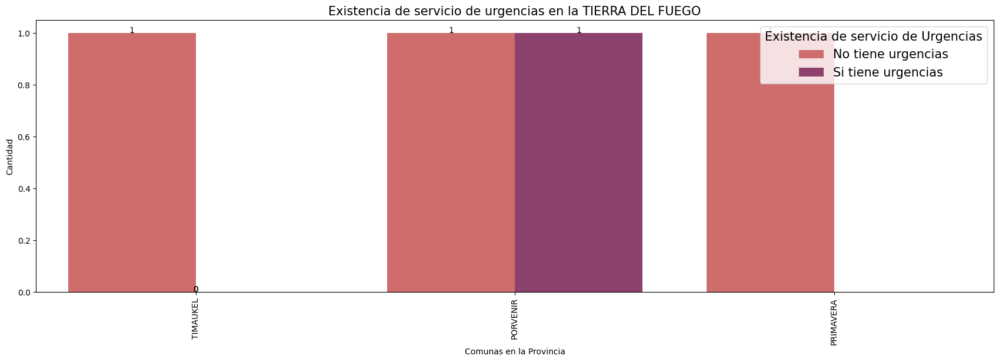

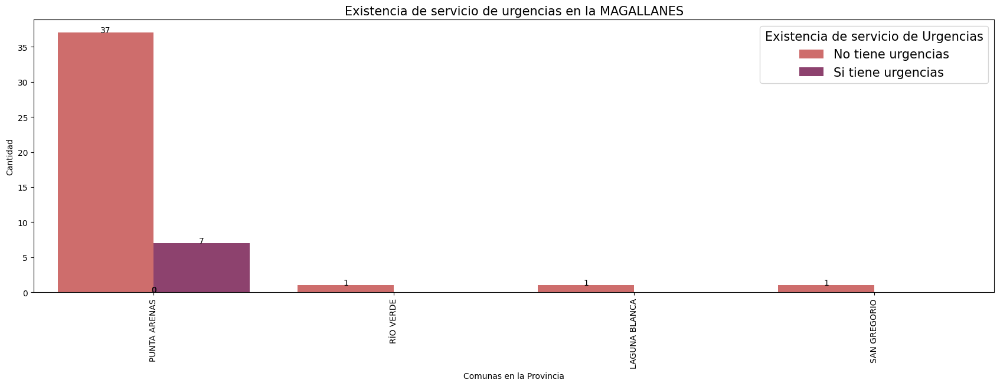

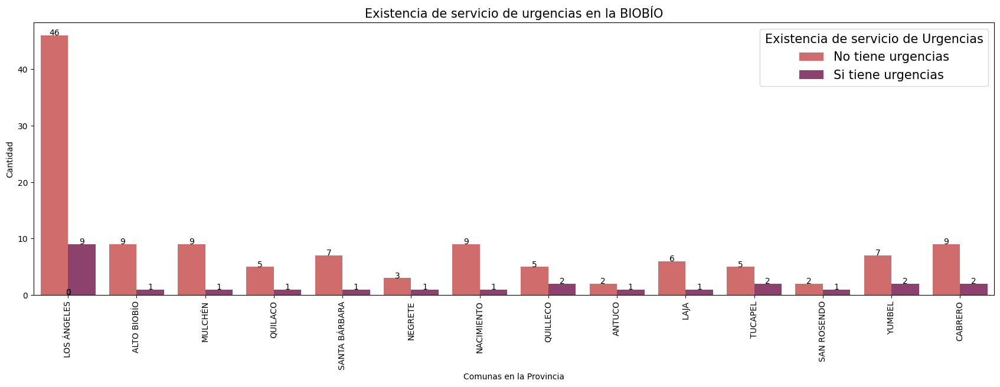

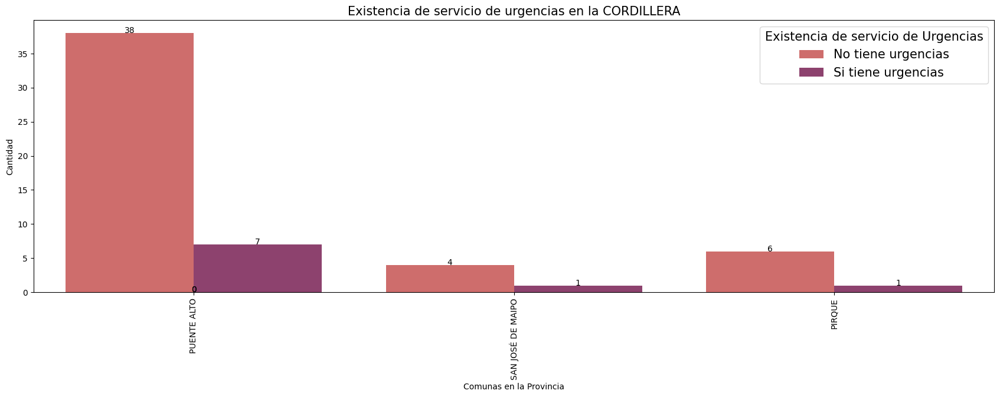

...

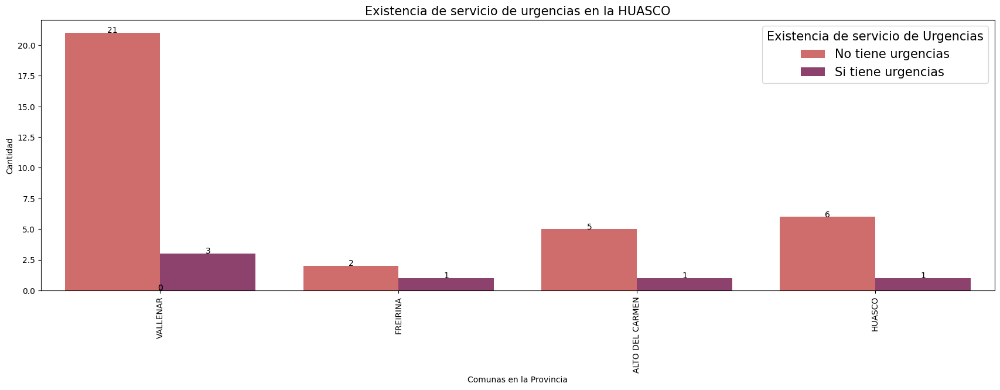

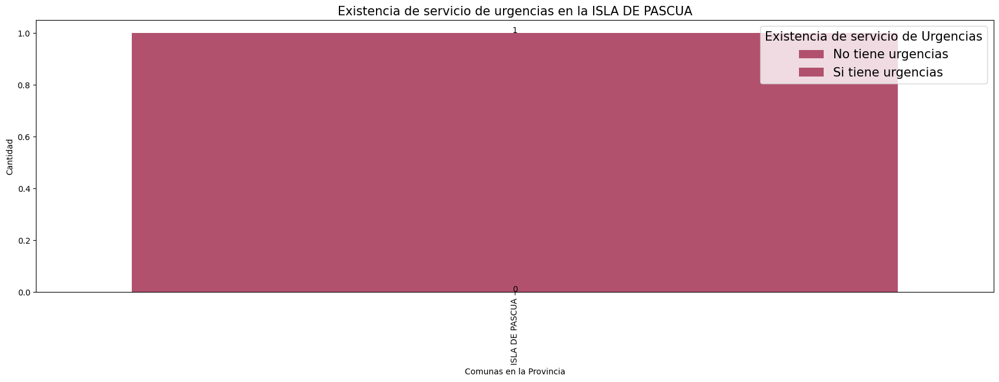

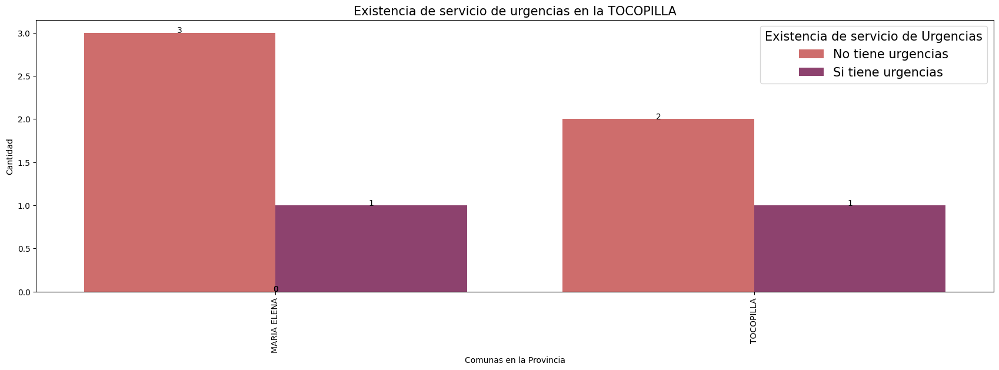

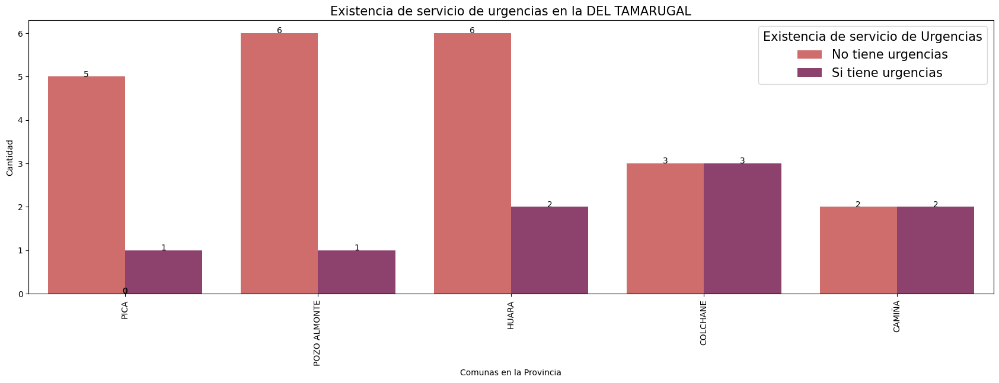

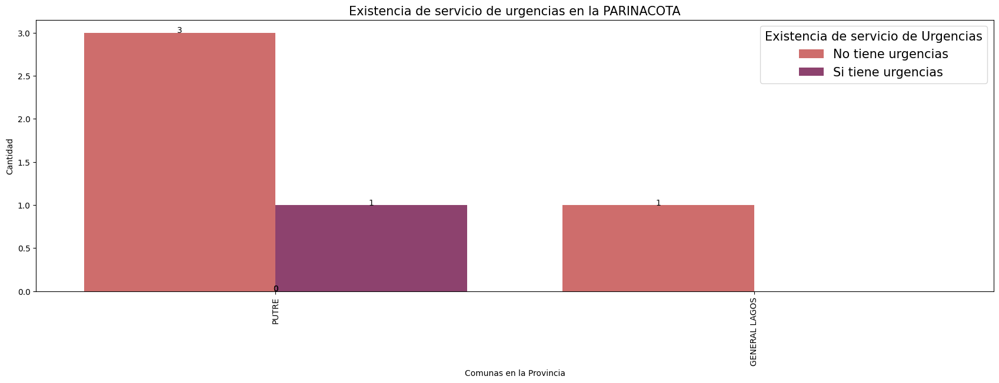

In [33]:
provincia_unicas = df_hospitales['nombre_provincia'].unique() #Dataframe que permite tener la información por provincia sin repetición entre estas 

# Establece el tamaño de la figura
plt.figure(figsize=(21, 6))

# Itera a través de las provincias y crea un gráfico para cada una
for provincia in provincia_unicas:
    plt.figure(figsize=(21, 6))
    #Se realiza un countplot por la existencia de categorías existencia de algún tipo de urgencia por provincia
    ax = sns.countplot(x="nombre_comuna", data=df_hospitales[df_hospitales['nombre_provincia'] == provincia], hue="tiene_servicio_de_urgencia", palette="flare")
    for p in ax.patches: 
        ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline',fontsize = "10")
    plt.title(f'Existencia de servicio de urgencias en la {provincia}',fontsize = "15")
    legend = plt.legend(["No tiene urgencias", "Si tiene urgencias"], fontsize = "15") #Ajustes de la caja resumen de categorias 
    legend.set_title("Existencia de servicio de Urgencias", prop={"size": "15"})
    plt.ylabel('Cantidad') #Nombre eje y
    plt.xlabel('Comunas en la Provincia') #Nombre eje x 
    plt.xticks(rotation=90) #Rotación label eje x 
    plt.show()

Se realizan gráficos de barra que permitan la visualización del total de distintos tipos de servicios de urgencia reunidos por región y provincia. 

<Figure size 2100x600 with 0 Axes>

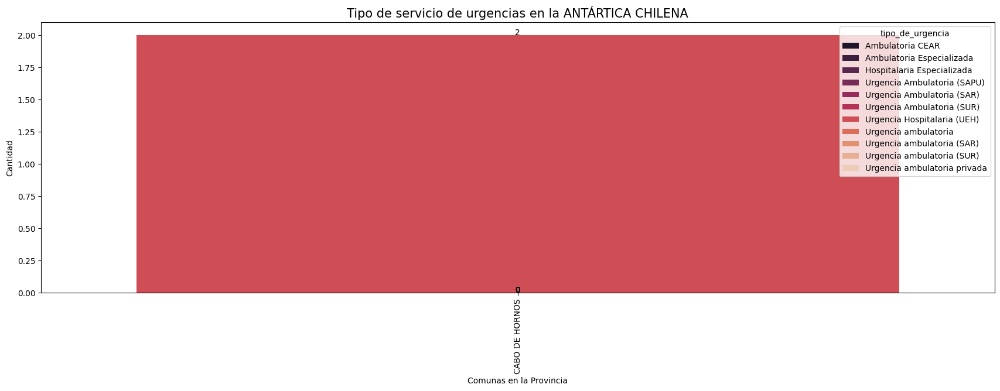

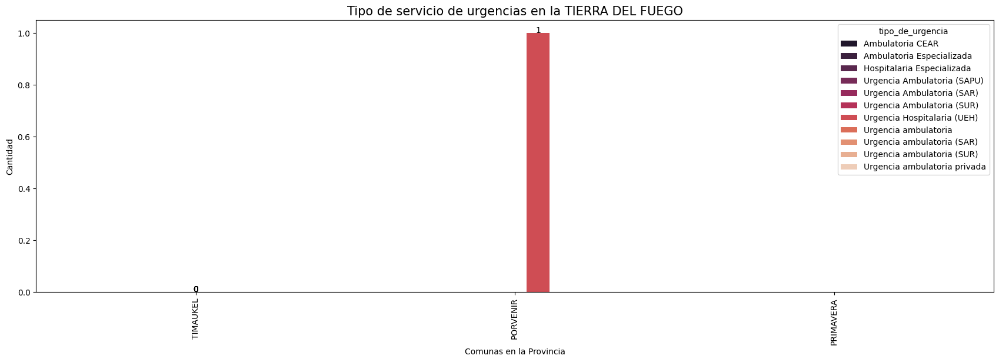

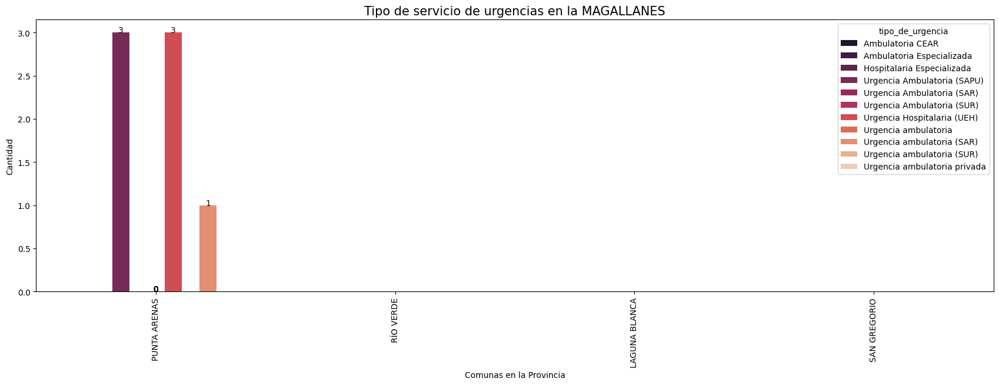

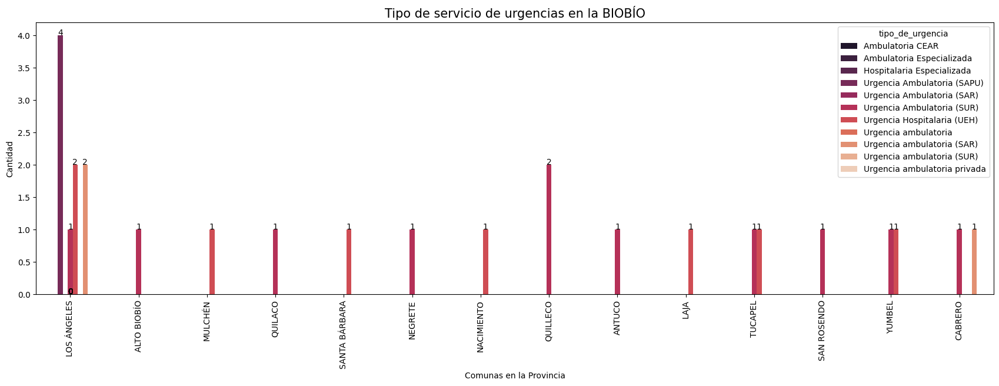

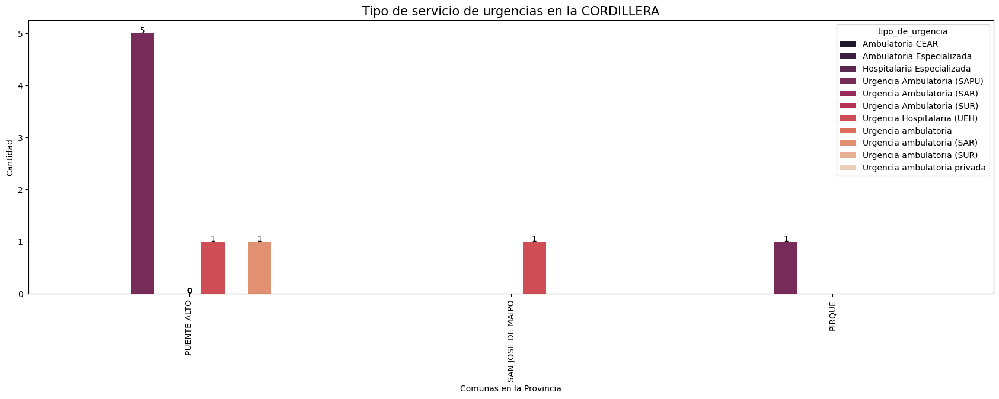

...

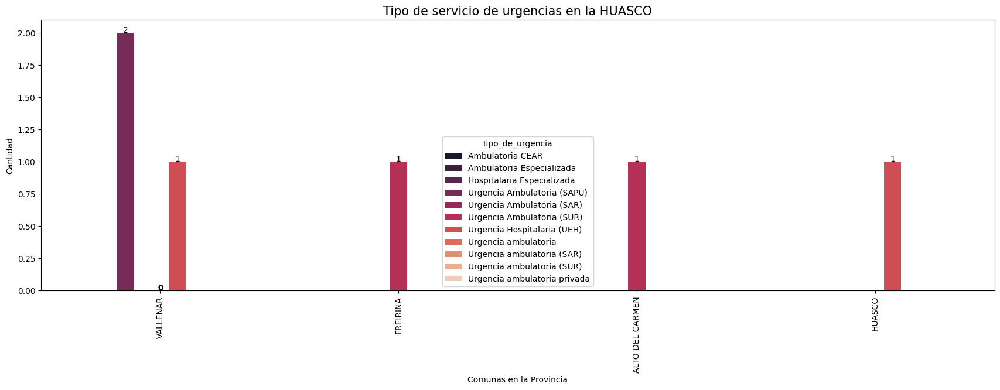

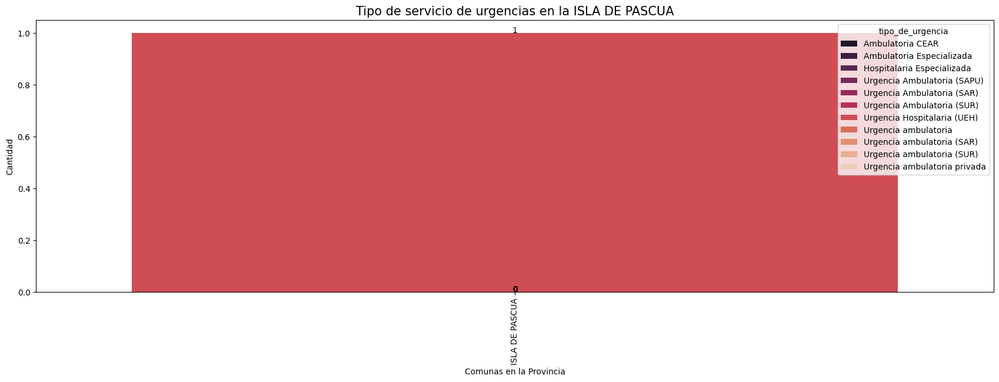

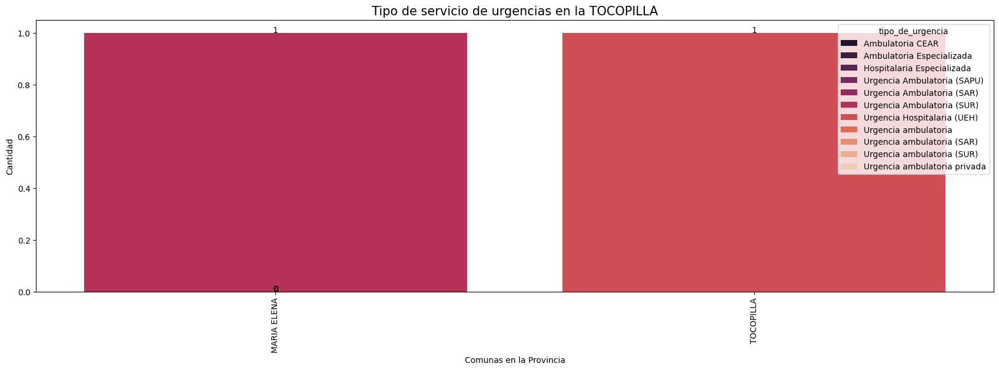

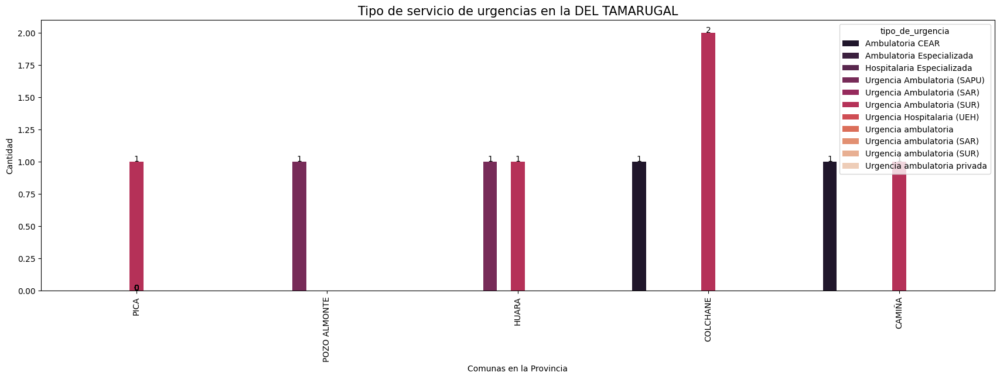

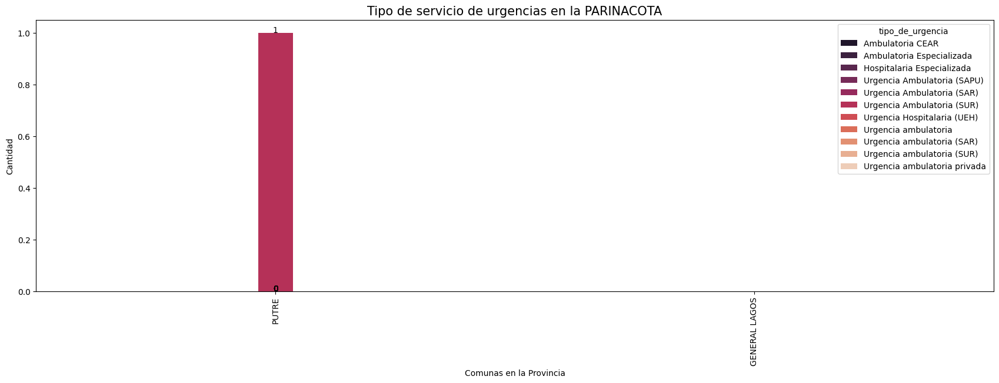

In [50]:
provincia_unicas = df_hospitales['nombre_provincia'].unique()  #Dataframe que permite tener la información por provincia sin repetición entre estas 

# Establece el tamaño de la figura
plt.figure(figsize=(21, 6))

# Itera a través de las pronvincias y crea un gráfico para cada una
for provincia in provincia_unicas:
    plt.figure(figsize=(21, 6))
    #Se realiza un countplot por la existencia de categoría con valores de tipos de urgencia existentes por provincia
    ax = sns.countplot(x="nombre_comuna", data=df_hospitales[df_hospitales['nombre_provincia'] == provincia], hue="tipo_de_urgencia", palette="rocket")
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline',fontsize = "10")
    plt.title(f'Tipo de servicio de urgencias en la {provincia}',fontsize = "15")
    plt.ylabel('Cantidad') #Nombre eje y
    plt.xlabel('Comunas en la Provincia') #Nombre eje x 
    plt.xticks(rotation=90) #Rotación label valores eje x 
    plt.show()

<Figure size 2500x1000 with 0 Axes>

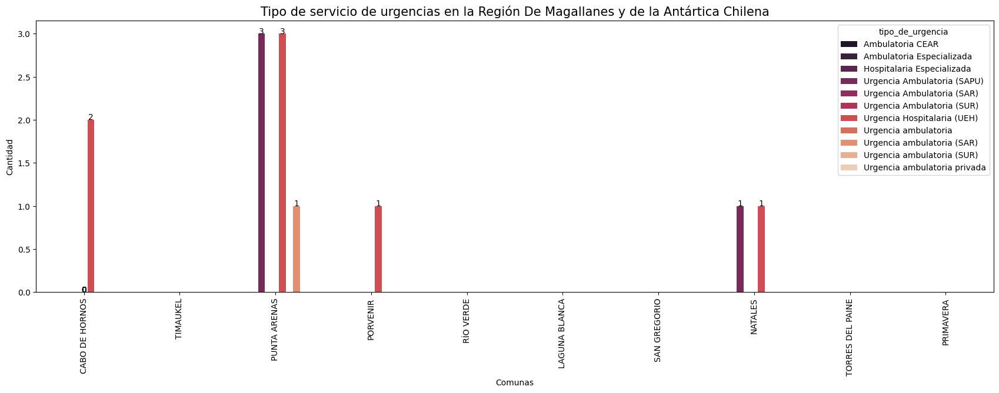

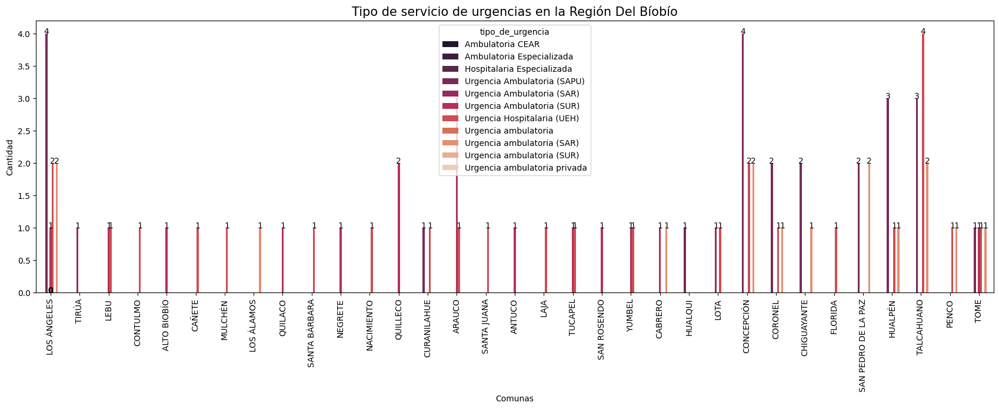

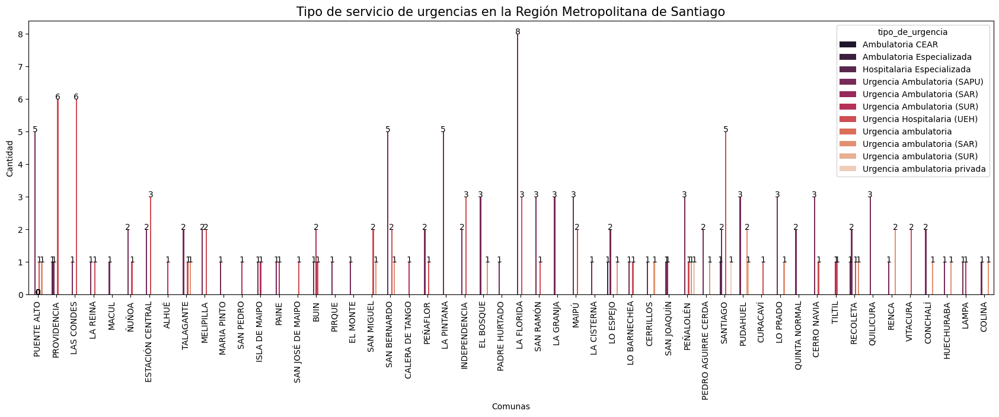

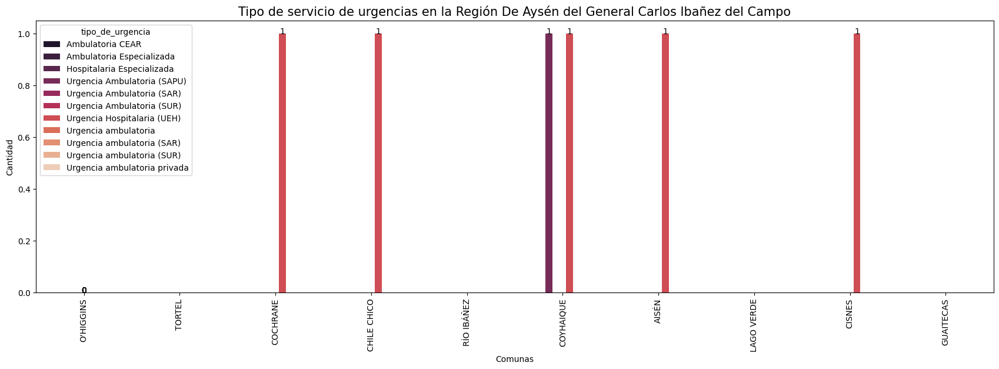

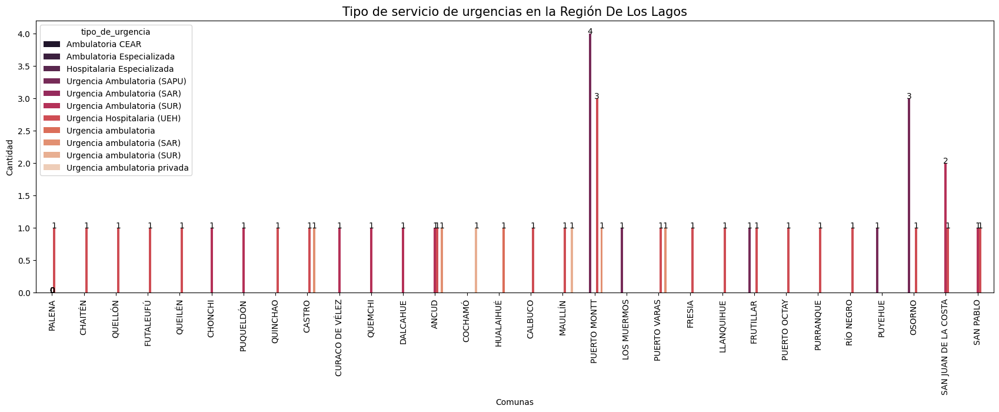

...

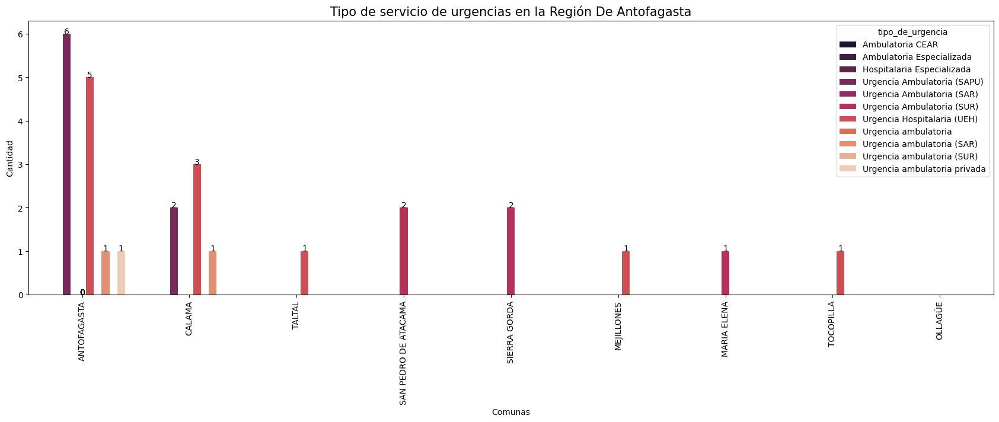

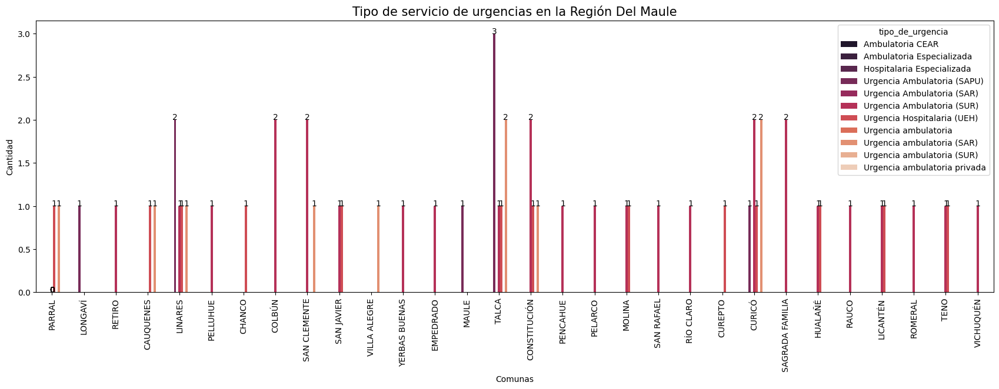

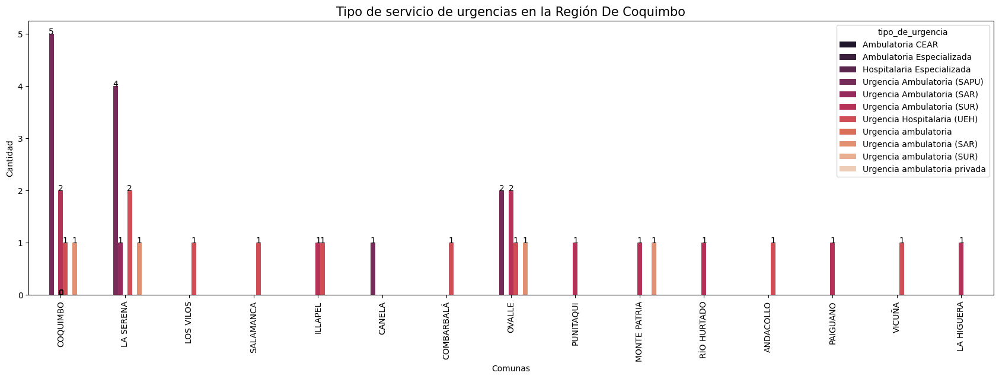

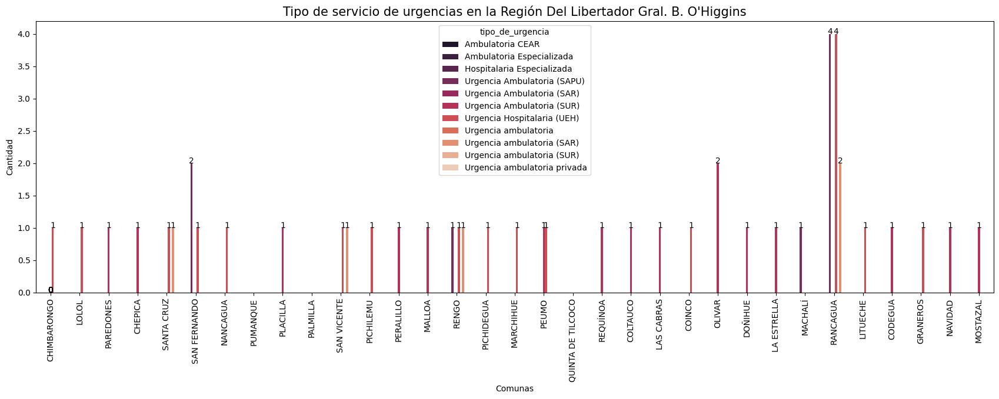

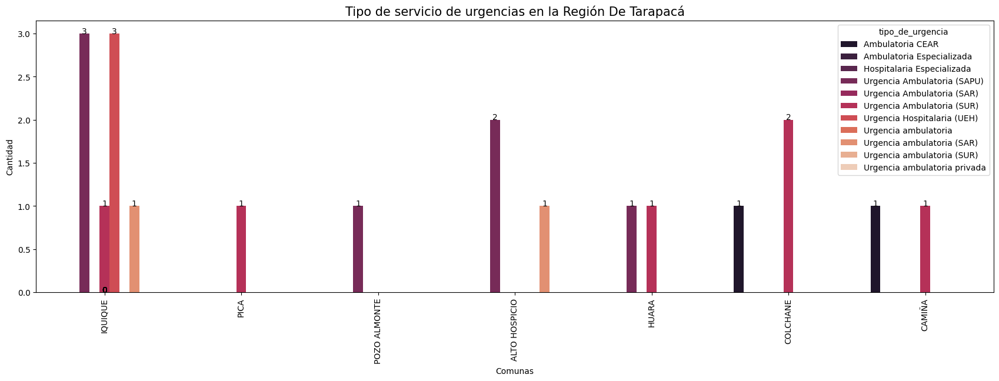

In [54]:
regiones_unicas = df_hospitales['nombre_región'].unique() #Dataframe que permite tener la información por región sin repetición entre estas

# Establece el tamaño de la figura
plt.figure(figsize=(25, 10))

# Itera a través de las regiones y crea un gráfico para cada una
for region in regiones_unicas:
    plt.figure(figsize=(21, 6))
    #Se realiza un countplot por la existencia de categoría con valores de tipos de urgencia existentes por región
    ax = sns.countplot(x="nombre_comuna", data=df_hospitales[df_hospitales['nombre_región'] == region], hue="tipo_de_urgencia", palette="rocket")
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline',fontsize = "10")
    plt.title(f'Tipo de servicio de urgencias en la {region}',fontsize = "15")
    plt.ylabel('Cantidad')
    plt.xlabel('Comunas')
    plt.xticks(rotation=90)
    plt.show()
#chatgpt en annotate
#https://www.delftstack.com/es/howto/matplotlib/matplotlib-legend-title/

¿Hay alguna comuna y/o región que no tenga un establecimiento de todos los tipos de complejidad y tipo de emergencia?  #resumen resultados

En la exploraicón de los datos se realizan variadas operaciones sobre los dataframes de los centro de salud a lo largo del país. 
Primeramente se trabaja en torno a la variable de exitencia de urgencias, donde el valor binario de True, False declaraba; la existencia y la no existencia de estos en una localidad específica, respectivamente. 
Por posibilidades de que hubieran zonas iguales escritas de forma diferente es que se hace con los códigos actuales únicos establecidos, sobretodo considerando que las comunas son muchas para su revisión detallada. 
Luego aquello que se extrae de este trabajo sobre los datos es lo siguiente: 

Existencia de servicio de urgencia : 
    En la contabilización global sin separación por ninguna división geográfica, la mayoría de centros médicos (todos sin separación por tipo) no tienen servicio de urgencias, predominando el valor False con 3784 entradas. Por lo tanto, solo 741 si cuentan con urgencias de cualquier tipo.  
    Luego en la búsqueda específica por región se tiene que no hay ninguna región que no tenga al menos un servicio de médico sin urgencias (de cualquier tipo).
1. Analizando los valores de todas las regiones en conjunto, la que tiene más servicios con urgencias es la Metropolitana con 177. Que a fecha de 2017 es también la con más población, 7.122.808.
1. La que tiene menos servicios de urgencia analizando todos los valores regionales en conjunto es la de Arica y Parinacota con 5. Su población a 2017 era de 226.068
1. En el porcentaje que equivale al total de centros con urgencia sobre el total de centros por cada región individual, la región con el más alto sobre las otras regiones fue Valparaíso con un 21,09%. Que tiene a 2017 una población de 1.815.902.
1. En el cálculo de porcentajes anteriores, en la región Metropolitana los centros con urgencia médica sobre su total de centros, equivale a 18,15%
1. La región con número más bajo de centros con urgencia sobre el total de centros de la región sola, comparado con las otras regiones es la región de Arica y Parinacota con 6,9%

Por provincia (dividida internamente por comuna) se observó según los gráficos que las comunas sin servicio de urgencia son : 
   1. Las Torres del Paine, en la provincia de Última Esperanza (22.686 habitantes)
   2. Primavera, en la provincia de Tierra del Fuego (8364 habitantes)
   3. San Gregorio, Río Verde y Laguna Blanca , en la provincia de Magallanes (133.282 habitantes)
   4. Río Ibañez, provincia de General Carrera (7531 habitantes)
   5. O´higgins y Tortel, en la provincia de Capitán Prat (4638 habitantes)
   6. Aysén, en la provincia de Aysén (32.319 habitantes)
   7. Lago Verde, en la provincia de Coyhaique (58.670 habitantes)
   8. Lumaco, Ercilla, Los Sauces y Renaico, en la provincia de Malleco (205.124 habitantes)
   9. Palmilla y Pumanque, en la provincia de Colchagua (22.556 habitantes)
   10. Quinta de Tilcoco, provincia de Cachapoal (646.133 habitantes)
   11. Panquehue, provincia de San Felipe de Aconcagua (154.718 habitantes)
   12. La Cruz, provincia de Quillota (203.277 habitantes)
   13. San Esteban y Rinconada , provincia de Los Andes (110.602 habitantes)
   14. Ollague , provincia de El Loa (177.048 habitantes)
   15. General lagos, provincia de Parinacota (3449 habitantes)
   16. Camarones, provincia de Arica (22.619 habitantes)


Existencia de servicio de urgencias: